In [1]:
# Imports
import os
import random
import torch
import math
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from tqdm import tqdm

# Utility function to generate a 2D grid of coordinates
def get_mgrid_2d(height, width, dim=2):
    x = torch.linspace(-1, 1, steps=width)
    y = torch.linspace(-1, 1, steps=height)
    mgrid = torch.stack(torch.meshgrid(y, x, indexing="ij"), dim=-1)
    return mgrid.reshape(-1, dim)

## Minimal functions needed for the Multiple Image Siren LIIF implementation to work

In [2]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.

    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a
    # hyperparameter.

    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)

    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first

        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)

        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                             1 / self.in_features)
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0,
                                             np.sqrt(6 / self.in_features) / self.omega_0)

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

    def forward_with_intermediate(self, input):
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate

In [3]:
class ConditionedSiren(nn.Module):
    def __init__(self, patch_size=3, hidden_dim=256):
        super().__init__()
        # Correct input dimension calculation (2 coords + 3*(3x3-1) patch values)
        input_dim = 2 + 3*(patch_size**2 - 1)  # Now 26 dimensions (2 + 24)

        self.net = nn.Sequential(
            SineLayer(input_dim, hidden_dim, is_first=True),
            SineLayer(hidden_dim, hidden_dim),
            SineLayer(hidden_dim, hidden_dim),
            nn.Linear(hidden_dim, 3)
        )

    def forward(self, coord, patch):
        x = torch.cat([coord, patch], dim=-1)
        return self.net(x)


# Super resolution Dataset

# TRYING CROPPING INSTEAD OF RESIZING

In [4]:
class SuperResolutionDatasetCropping(Dataset):
    def __init__(self, hr_image_path, crop_size=(512, 512), scale_factor=8, patch_size=3, upscale_method=Image.BILINEAR, random_crop=True):
        super().__init__()
        self.patch_size = patch_size
        self.pad_size = patch_size // 2
        self.scale_factor = scale_factor
        self.crop_size = crop_size

        # Load HR image at full resolution
        hr_img = Image.open(hr_image_path).convert('RGB')

        # Get original image dimensions
        orig_width, orig_height = hr_img.size
        crop_width, crop_height = crop_size

        # Make sure the image is large enough for cropping
        if orig_width < crop_width or orig_height < crop_height:
            # If image is too small, resize it to at least the crop size
            scale = max(crop_width / orig_width, crop_height / orig_height)
            new_width = int(orig_width * scale)
            new_height = int(orig_height * scale)
            hr_img = hr_img.resize((new_width, new_height), Image.BICUBIC)
            orig_width, orig_height = new_width, new_height

        # Crop the HR image
        if random_crop:
            # Random crop for training variability
            left = random.randint(0, orig_width - crop_width)
            top = random.randint(0, orig_height - crop_height)
        else:
            # Center crop for consistent validation
            left = (orig_width - crop_width) // 2
            top = (orig_height - crop_height) // 2

        hr_img = hr_img.crop((left, top, left + crop_width, top + crop_height))

        # Calculate LR size
        lr_width = crop_width // scale_factor
        lr_height = crop_height // scale_factor

        # Create LR image: downscale first
        small_lr_img = hr_img.resize((lr_width, lr_height), Image.BICUBIC)

        # Then upscale back to original size with specified interpolation to create blurry image
        lr_img = small_lr_img.resize(crop_size, upscale_method)

        # Convert to tensors and normalize to [-1, 1]
        self.hr_tensor = torch.from_numpy(np.array(hr_img)).float() / 127.5 - 1.0
        self.lr_tensor = torch.from_numpy(np.array(lr_img)).float() / 127.5 - 1.0

        # Permute to CxHxW
        self.hr_tensor = self.hr_tensor.permute(2, 0, 1)
        self.lr_tensor = self.lr_tensor.permute(2, 0, 1)

        # Create coordinate grid for HR image
        h_hr, w_hr = self.hr_tensor.shape[1], self.hr_tensor.shape[2]
        self.coords = get_mgrid_2d(h_hr, w_hr)

        # Precompute all data
        self.data = []
        padded_lr = F.pad(self.lr_tensor.unsqueeze(0), (self.pad_size,) * 4, mode='reflect')[0]
        c, h, w = self.hr_tensor.shape

        for idx in range(self.coords.shape[0]):
            y = idx // w
            x = idx % w

            # Extract LR patch directly from the same position in the blurry image
            patch = padded_lr[:, y:y + self.patch_size, x:x + self.patch_size]
            patch = patch.reshape(3, -1)  # [3, patch_size²]

            # Use complete patch including center pixel
            patch = patch.flatten()  # [3*patch_size²]

            self.data.append({
                'coord': self.coords[idx],
                'patch': patch,
                'target': self.hr_tensor[:, y, x]
            })

        # Store the original HR and LR images for visualization
        self.hr_img = hr_img
        self.lr_img = lr_img

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

    def get_images(self):
        """Return the HR and LR images as PIL Images for inspection"""
        return self.hr_img, self.lr_img

In [5]:
def create_datasets(image_paths, crop_size=(512, 512), scale_factor=8, patch_size=3, upscale_method=Image.BILINEAR):
    """
    Create datasets from a list of image paths with proper cropping instead of resizing.

    Args:
        image_paths: List of paths to HR images
        crop_size: Size to crop the images to (default: (512, 512))
        scale_factor: Downscaling factor (default: 8)
        patch_size: Size of patches for feature extraction (default: 3)
        upscale_method: Method to use for upscaling (default: Image.BILINEAR)

    Returns:
        List of SuperResolutionDataset objects
    """
    datasets = []

    for i, path in enumerate(image_paths):
        try:
            # Use random crop for training, center crop for validation
            is_random = i < len(image_paths) - 2  # Last 2 images use center crop for consistent validation
            dataset = SuperResolutionDataset(
                path,
                crop_size=crop_size,
                scale_factor=scale_factor,
                patch_size=patch_size,
                upscale_method=upscale_method,
                random_crop=is_random
            )
            datasets.append(dataset)

            if i == 0:  # For the first image, show what we're working with
                hr_img, lr_img = dataset.get_images()

                plt.figure(figsize=(10, 5))
                plt.subplot(121)
                plt.imshow(hr_img)
                plt.title(f"HR Image (Cropped to {crop_size})")
                plt.axis('off')

                plt.subplot(122)
                plt.imshow(lr_img)
                plt.title(f"LR Image (Downscaled by {scale_factor} then Upscaled)")
                plt.axis('off')

                plt.tight_layout()
                plt.show()

        except Exception as e:
            print(f"Error processing {path}: {e}")

    return datasets

def prepare_datasets(config):
    """
    Prepare training and validation datasets based on configuration.

    Args:
        config: Configuration object with dataset parameters

    Returns:
        train_loader, val_loader, train_datasets, val_datasets
    """
    # Data preparation
    data_folder = '/content/drive/MyDrive/data/DIV2K_train_HR'
    image_paths = [os.path.join(data_folder, fname) for fname in os.listdir(data_folder)
                  if fname.endswith(('.png', '.jpg', '.jpeg'))]

    # Sort for reproducibility
    image_paths.sort()

    # Split train/val
    train_paths = image_paths[:config.num_train_images]
    val_paths = image_paths[config.num_train_images:config.num_train_images+2]

    print(f"Creating datasets for {len(train_paths)} training and {len(val_paths)} validation images...")

    # Create datasets
    train_datasets = create_datasets(
        train_paths,
        crop_size=config.crop_size,
        scale_factor=config.scale_factor,
        patch_size=config.patch_size,
        upscale_method=config.upscale_method
    )

    val_datasets = create_datasets(
        val_paths,
        crop_size=config.crop_size,
        scale_factor=config.scale_factor,
        patch_size=config.patch_size,
        upscale_method=config.upscale_method
    )

    # Create concatenated datasets
    train_dataset = torch.utils.data.ConcatDataset(train_datasets)
    val_dataset = torch.utils.data.ConcatDataset(val_datasets)

    print(f"Training samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")

    # Create data loaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=config.batch_size,
        shuffle=True,
        num_workers=config.num_workers if hasattr(config, 'num_workers') else 0,
        pin_memory=True
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers if hasattr(config, 'num_workers') else 0,
        pin_memory=True
    )

    return train_loader, val_loader, train_datasets, val_datasets

# EVERYTHING BELOW CAN BE RAN WITHOUT PROBLEM

In [6]:
class SuperResolutionDataset(Dataset):
    def __init__(self, hr_image_path, img_size=(512, 512), scale_factor=8, patch_size=3, upscale_method=Image.BILINEAR):
        super().__init__()
        self.patch_size = patch_size
        self.pad_size = patch_size // 2
        self.scale_factor = scale_factor


        # Load HR image
        hr_img = Image.open(hr_image_path).convert('RGB')
        hr_img = hr_img.resize(img_size)

        # Calculate LR size
        lr_width = hr_img.size[0] // scale_factor
        lr_height = hr_img.size[1] // scale_factor

        # Create LR image: downscale first
        small_lr_img = hr_img.resize((lr_width, lr_height), Image.BICUBIC)

        # Then upscale back to original size with bilinear interpolation to create blurry image
        lr_img = small_lr_img.resize(img_size, upscale_method)

        # Convert to tensors and normalize to [-1, 1]
        self.hr_tensor = torch.from_numpy(np.array(hr_img)).float() / 127.5 - 1.0
        self.lr_tensor = torch.from_numpy(np.array(lr_img)).float() / 127.5 - 1.0

        # Permute to CxHxW
        self.hr_tensor = self.hr_tensor.permute(2, 0, 1)
        self.lr_tensor = self.lr_tensor.permute(2, 0, 1)

        # Create coordinate grid for HR image
        h_hr, w_hr = self.hr_tensor.shape[1], self.hr_tensor.shape[2]
        self.coords = get_mgrid_2d(h_hr, w_hr)

        # Precompute all data
        self.data = []
        padded_lr = F.pad(self.lr_tensor.unsqueeze(0), (self.pad_size,) * 4, mode='reflect')[0]
        c, h, w = self.hr_tensor.shape

        for idx in range(self.coords.shape[0]):
            y = idx // w
            x = idx % w

            # Extract LR patch directly from the same position in the blurry image
            # No need to scale coordinates since LR and HR are the same size now
            patch = padded_lr[:, y:y + self.patch_size, x:x + self.patch_size]
            patch = patch.reshape(3, -1)  # [3, patch_size²]

            # Remove center pixel
            # patch = torch.cat([patch[:, :4], patch[:, 5:]], dim=1).flatten()  # [3*(patch_size²-1)]
            patch = patch.flatten() # [3*(patch_size²)]

            self.data.append({
                'coord': self.coords[idx],
                'patch': patch,
                'target': self.hr_tensor[:, y, x]
            })

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

In [7]:
class ImprovedConditionedSiren(nn.Module):
  def __init__(self, patch_size=3, hidden_dim=256):
    super().__init__()
    #input_dim = 2 + 3*(patch_size**2 - 1) # 2 coords + patch values
    input_dim = 2 + 3*(patch_size**2) # 2 coords + patch values

        # Initial layer
    self.input_layer = SineLayer(input_dim, hidden_dim, is_first=True)

    # Multiple SIREN layers with skip connections
    self.layers = nn.ModuleList([
        SineLayer(hidden_dim, hidden_dim) for _ in range(4)
    ])

    # Final output layer
    self.output_layer = nn.Linear(hidden_dim, 3)

    # Skip connection mixing parameters
    self.skip_weights = nn.Parameter(torch.ones(8))
    self.softmax = nn.Softmax(dim=0)

  def forward(self, coord, patch, patch_size=3):
    x = torch.cat([coord, patch], dim=-1)

    # Initial layer
    x = self.input_layer(x)

    # Store intermediate outputs for skip connections
    intermediates = []
    for layer in self.layers:
        x = layer(x)
        intermediates.append(x)

    # Weighted sum of all intermediate outputs
    weights = self.softmax(self.skip_weights)
    x = sum(w * output for w, output in zip(weights, intermediates))
    out = self.output_layer(x)
    index_rgb = math.floor(patch_size/2)
    offset = patch_size ** 2
    patch_rgb = torch.cat((patch[:, index_rgb:index_rgb+1], patch[:, index_rgb+offset:index_rgb+offset+1], patch[:, index_rgb+2*offset:index_rgb+2*offset+1]), dim=1)

    #patch_rgb = torch.cat((patch[:, 4:5], patch[:, 4+9:5+9], patch[:, 4+18:5+18]), dim=1)
    #print("out", out.shape)
    #print("patch_rgb", patch_rgb.shape)

    return out + patch_rgb

In [8]:
class Config:
    def __init__(self):
        # Dataset parameters
        self.crop_size = (512, 512)        # Size to crop the images to
        self.scale_factor = 8              # Downscaling/upscaling factor
        self.patch_size = 5                # Increased patch size for better context
        self.upscale_method = Image.BILINEAR
        self.num_train_images = 6
        self.num_workers = 2               # DataLoader workers

        # Training parameters
        self.batch_size = 128              # Larger batch size for more stable gradients
        self.epochs = 50
        self.lr = 3e-5                     # Lower learning rate for more stable training
        self.hidden_dim = 256

        # Loss function parameters
        self.use_color_loss = True          # Use specialized color loss
        self.use_combined_loss = True       # Use combined perceptual + color loss
        self.color_weight = 2.5             # Increased weight for color components
        self.edge_weight = 1.0              # Weight for edge preservation

        # Optimizer parameters
        self.grad_clip_value = 1.0          # Gradient clipping

        # Scheduler parameters
        self.use_scheduler = True
        self.scheduler_factor = 0.5
        self.scheduler_patience = 3
        self.min_lr = 1e-6
        self.schedule_by_psnr = True        # Use PSNR for scheduler

        # Model saving parameters
        self.save_by_psnr = True            # Save model by PSNR instead of loss

        # EMA parameters
        self.use_ema = True                 # Use Exponential Moving Average for weights
        self.ema_alpha = 0.95               # EMA coefficient (higher = slower update)

        # Visualization parameters
        self.visualize_every = 5
        self.max_val_visualize = 2          # Max number of validation images to visualize

In [9]:
class TrainingConfig:
  def __init__(self):
    self.epochs = 20 # Increased from 2
    self.batch_size = 1024 # Reduced from 2048 for better stability
    self.lr = 1e-4
    self.scale_factor = 2 # Super-resolution scale factor
    self.num_train_images = 6 # Increased from 4
    self.visualize_every = 2

        # Scheduler parameters
    self.use_scheduler = True
    self.scheduler_factor = 0.5
    self.scheduler_patience = 5
    self.min_lr = 1e-6

    # Model parameters
    self.hidden_dim = 256
    self.patch_size = 3


In [10]:
config = TrainingConfig()

In [11]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
device

device(type='mps')

In [12]:
def train_super_resolution_improved_loss(config, train_loader, val_loader, train_dataset, val_dataset):
    # Model and optimizer
    device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
    model = ImprovedConditionedSiren(
        patch_size=config.patch_size,
        hidden_dim=config.hidden_dim
    ).to(device)

    # Use a lower initial learning rate for better convergence
    optimizer = torch.optim.Adam(model.parameters(), lr=config.lr, betas=(0.9, 0.999), eps=1e-8)

    if config.use_scheduler:
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=config.scheduler_factor,
            patience=config.scheduler_patience, min_lr=config.min_lr, verbose=True
        )

    # Define custom losses for improved color handling
    def color_loss(pred, target):
        """Loss focusing on color differences in different color spaces"""
        # RGB space MSE
        mse_loss = F.mse_loss(pred, target)

        # Convert to "YCbCr" space approximation
        # Y = 0.299R + 0.587G + 0.114B
        # Cb = -0.1687R - 0.3313G + 0.5B + 0.5
        # Cr = 0.5R - 0.4187G - 0.0813B + 0.5
        pred_y = 0.299*pred[:, 0] + 0.587*pred[:, 1] + 0.114*pred[:, 2]
        target_y = 0.299*target[:, 0] + 0.587*target[:, 1] + 0.114*target[:, 2]

        pred_cb = -0.1687*pred[:, 0] - 0.3313*pred[:, 1] + 0.5*pred[:, 2] + 0.5
        target_cb = -0.1687*target[:, 0] - 0.3313*target[:, 1] + 0.5*target[:, 2] + 0.5

        pred_cr = 0.5*pred[:, 0] - 0.4187*pred[:, 1] - 0.0813*pred[:, 2] + 0.5
        target_cr = 0.5*target[:, 0] - 0.4187*target[:, 1] - 0.0813*target[:, 2] + 0.5

        # Weight color components more heavily to address the color issues
        y_loss = F.mse_loss(pred_y, target_y)
        cb_loss = F.mse_loss(pred_cb, target_cb)
        cr_loss = F.mse_loss(pred_cr, target_cr)

        # Combined loss with higher weights on color components
        return mse_loss + config.color_weight * (cb_loss + cr_loss)

    def perceptual_and_color_loss(pred, target):
        """Combined loss focusing on perceptual quality and color accuracy"""
        # Base MSE for general reconstruction
        mse = F.mse_loss(pred, target)

        # Color loss component
        col_loss = color_loss(pred, target)

        # Add gradient loss to preserve edges and structures
        # Calculate gradients using simple approximation
        pred_dx = torch.abs(pred[:, :, 1:] - pred[:, :, :-1])
        target_dx = torch.abs(target[:, :, 1:] - target[:, :, :-1])
        grad_x_loss = F.l1_loss(pred_dx, target_dx)

        return mse + config.color_weight * col_loss + config.edge_weight * grad_x_loss

    # Training loop
    best_val_loss = float('inf')
    best_val_psnr = 0
    train_losses = []
    val_losses = []
    val_psnrs = []

    # Gradient clipping value
    grad_clip_value = config.grad_clip_value

    for epoch in tqdm(range(config.epochs)):
        # Training
        model.train()
        train_loss = 0
        for batch_idx, batch in enumerate(train_loader):
            coords = batch['coord'].to(device)
            patches = batch['patch'].to(device)
            targets = batch['target'].to(device)

            # Forward pass
            preds = model(coords, patches)

            # Apply the selected loss function
            if config.use_combined_loss:
                loss = perceptual_and_color_loss(preds, targets)
            elif config.use_color_loss:
                loss = color_loss(preds, targets)
            else:
                loss = F.mse_loss(preds, targets)

            # Backward pass with gradient clipping
            optimizer.zero_grad()
            loss.backward()

            # Gradient clipping to prevent exploding gradients
            if grad_clip_value > 0:
                torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip_value)

            optimizer.step()

            train_loss += loss.item()

            # Print occasional batch progress
            if batch_idx % 100 == 0:
                print(f"Epoch {epoch+1}, Batch {batch_idx}, Loss: {loss.item():.6f}")

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        # Validation
        model.eval()
        val_loss = 0
        accumulated_psnr = 0

        with torch.no_grad():
            for batch in val_loader:
                coords = batch['coord'].to(device)
                patches = batch['patch'].to(device)
                targets = batch['target'].to(device)

                preds = model(coords, patches)

                # Use the same loss as training for consistency
                if config.use_combined_loss:
                    loss = perceptual_and_color_loss(preds, targets)
                elif config.use_color_loss:
                    loss = color_loss(preds, targets)
                else:
                    loss = F.mse_loss(preds, targets)

                val_loss += loss.item()

                # Calculate PSNR for this batch
                mse = F.mse_loss(preds, targets).item()
                if mse > 0:
                    psnr = 10 * np.log10(4.0 / mse)  # 4.0 because our range is [-1,1]
                    accumulated_psnr += psnr

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        # Average PSNR across validation batches
        avg_val_psnr = accumulated_psnr / len(val_loader) if len(val_loader) > 0 else 0
        val_psnrs.append(avg_val_psnr)

        # Scheduler step - can be based on loss or PSNR
        if config.use_scheduler:
            if config.schedule_by_psnr:
                scheduler.step(-avg_val_psnr)  # Negative because we want to maximize PSNR
            else:
                scheduler.step(val_loss)

        # Save best model - can be based on loss or PSNR
        if config.save_by_psnr:
            if avg_val_psnr > best_val_psnr:
                best_val_psnr = avg_val_psnr
                torch.save(model.state_dict(), 'best_super_res_model_psnr.pth')
                print(f"New best model saved with PSNR: {best_val_psnr:.2f} dB")
        else:
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                torch.save(model.state_dict(), 'best_super_res_model_loss.pth')
                print(f"New best model saved with loss: {best_val_loss:.6f}")

        # Print progress
        print(f"Epoch {epoch+1}/{config.epochs}")
        print(f"Train Loss: {train_loss:.6f}, Val Loss: {val_loss:.6f}, Val PSNR: {avg_val_psnr:.2f} dB")
        print(f"LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Apply EMA to model weights for more stable outputs
        if config.use_ema and epoch > 0:
            # Load previous best model
            prev_state_dict = torch.load('best_super_res_model_loss.pth' if not config.save_by_psnr else 'best_super_res_model_psnr.pth')
            current_state_dict = model.state_dict()

            # Apply EMA
            for key in prev_state_dict:
                if key in current_state_dict:
                    current_state_dict[key] = config.ema_alpha * current_state_dict[key] + (1 - config.ema_alpha) * prev_state_dict[key]

            # Update model with EMA weights
            model.load_state_dict(current_state_dict)

        # Visualize progress
        if (epoch + 1) % config.visualize_every == 0 or epoch == 0:
            for i, val_ds in enumerate(val_dataset):
                if i >= config.max_val_visualize:
                    break
                visualize_results(model, val_ds, device)

    # Plot training history
    plt.figure(figsize=(12, 5))

    plt.subplot(121)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')

    plt.subplot(122)
    plt.plot(val_psnrs, label='Validation PSNR')
    plt.xlabel('Epochs')
    plt.ylabel('PSNR (dB)')
    plt.legend()
    plt.title('Validation PSNR')

    plt.tight_layout()
    plt.show()

    return {
        'model': model,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'val_psnrs': val_psnrs,
        'best_val_loss': best_val_loss,
        'best_val_psnr': best_val_psnr
    }

In [13]:
def train_super_resolution(config, train_loader, val_loader, train_dataset, val_dataset):


  # Model and optimizer
  device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
  model = ImprovedConditionedSiren(
      patch_size=config.patch_size,
      hidden_dim=config.hidden_dim
  ).to(device)

  optimizer = torch.optim.Adam(model.parameters(), lr=config.lr)

  if config.use_scheduler:
      scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
          optimizer, mode='min', factor=config.scheduler_factor,
          patience=config.scheduler_patience, min_lr=config.min_lr
      )

  # Training loop
  best_val_loss = float('inf')
  train_losses = []
  val_losses = []

  for epoch in tqdm(range(config.epochs)):
      # Training
      model.train()
      train_loss = 0
      for batch in (train_loader):
          coords = batch['coord'].to(device)
          patches = batch['patch'].to(device)
          targets = batch['target'].to(device)

          preds = model(coords, patches)
          loss = F.mse_loss(preds, targets)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          train_loss += loss.item()

      train_loss /= len(train_loader)
      train_losses.append(train_loss)

      # Validation
      model.eval()
      val_loss = 0
      with torch.no_grad():
          for batch in val_loader:
              coords = batch['coord'].to(device)
              patches = batch['patch'].to(device)
              targets = batch['target'].to(device)

              preds = model(coords, patches)
              val_loss += F.mse_loss(preds, targets).item()

      val_loss /= len(val_loader)
      val_losses.append(val_loss)

      # Scheduler step
      if config.use_scheduler:
          scheduler.step(val_loss)

      # Save best model
      if val_loss < best_val_loss:
          best_val_loss = val_loss
          torch.save(model.state_dict(), 'best_super_res_model.pth')

      # Print progress
      print(f"Epoch {epoch+1}/{config.epochs}")
      print(f"Train Loss: {train_loss:.6f}, Val Loss: {val_loss:.6f}")
      print(f"LR: {optimizer.param_groups[0]['lr']:.2e}")

      # Visualize progress
      if (epoch + 1) % config.visualize_every == 0:
          visualize_results(model, val_datasets[0], device)

In [14]:
def visualize_results(model, dataset, device, batch_size=1024):
    model.eval()
    with torch.no_grad():
        # Convert LR and HR tensors to images in [0, 1] range for visualization
        lr_img = (dataset.lr_tensor.permute(1, 2, 0).cpu().numpy() + 1) / 2
        hr_img = (dataset.hr_tensor.permute(1, 2, 0).cpu().numpy() + 1) / 2

        # Get image dimensions
        h, w = dataset.hr_tensor.shape[1:]

        # Initialize predicted image array
        sr_img = np.zeros((h, w, 3))

        # Process in batches to avoid memory issues
        for i in range(0, len(dataset), batch_size):
            # Get batch data
            batch_data = dataset.data[i:i+batch_size]

            # Extract coordinates, patches and corresponding indices
            batch_coords = torch.stack([item['coord'] for item in batch_data]).to(device)
            batch_patches = torch.stack([item['patch'] for item in batch_data]).to(device)

            # Get batch predictions
            batch_preds = model(batch_coords, batch_patches)


            # Convert to numpy and place in the right positions in the output image
            batch_preds_np = batch_preds.cpu().numpy()

            # Calculate indices in the image
            start_idx = i
            end_idx = min(i + batch_size, len(dataset))

            for j in range(end_idx - start_idx):
                idx = start_idx + j
                y = idx // w
                x = idx % w

                if y < h and x < w:  # Safety check
                    sr_img[y, x] = batch_preds_np[j]

        # Rescale to [0, 1]
        sr_img = (sr_img + 1) / 2

        # Calculate PSNR for quantitative comparison
        def calculate_psnr(img1, img2):
            mse = np.mean((img1 - img2) ** 2)
            if mse == 0:
                return float('inf')
            max_pixel = 1.0
            psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
            return psnr

        sr_psnr = calculate_psnr(sr_img, hr_img)
        lr_psnr = calculate_psnr(lr_img, hr_img)

        # Plot with PSNR values
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(lr_img.clip(0, 1))
        plt.title(f'Low Resolution\nPSNR: {lr_psnr:.2f} dB')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(sr_img.clip(0, 1))
        plt.title(f'Super Resolution\nPSNR: {sr_psnr:.2f} dB')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hr_img.clip(0, 1))
        plt.title('High Resolution (Ground Truth)')
        plt.axis('off')

        # Add difference visualization
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        diff_lr = np.abs(lr_img - hr_img)
        plt.imshow(diff_lr, cmap='hot')
        plt.title('LR Error Map')
        plt.axis('off')
        plt.colorbar(fraction=0.046, pad=0.04)

        plt.subplot(132)
        diff_sr = np.abs(sr_img - hr_img)
        plt.imshow(diff_sr, cmap='hot')
        plt.title('SR Error Map')
        plt.axis('off')
        plt.colorbar(fraction=0.046, pad=0.04)

        plt.subplot(133)
        improvement = diff_lr - diff_sr
        plt.imshow(improvement, cmap='bwr')
        plt.title('Improvement (Red=Better)')
        plt.axis('off')
        plt.colorbar(fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

In [15]:
# Data preparation
data_folder = 'data/DIV2K_train_HR'
image_paths = [os.path.join(data_folder, fname) for fname in os.listdir(data_folder) if fname.endswith(('.png', '.jpg', '.jpeg'))]
# Split train/val
train_paths = image_paths[:config.num_train_images]
val_paths = image_paths[config.num_train_images:config.num_train_images+2]

# Create datasets
train_datasets = [SuperResolutionDataset(path, scale_factor=config.scale_factor) for path in train_paths]
val_datasets = [SuperResolutionDataset(path, scale_factor=config.scale_factor) for path in val_paths]

train_dataset = torch.utils.data.ConcatDataset(train_datasets)
val_dataset = torch.utils.data.ConcatDataset(val_datasets)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=config.batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=config.batch_size, shuffle=False)

  5%|▌         | 1/20 [00:19<06:05, 19.21s/it]

Epoch 1/20
Train Loss: 0.006314, Val Loss: 0.008843
LR: 1.00e-04
Epoch 2/20
Train Loss: 0.005620, Val Loss: 0.008440
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23911696672439575..0.2564876675605774].


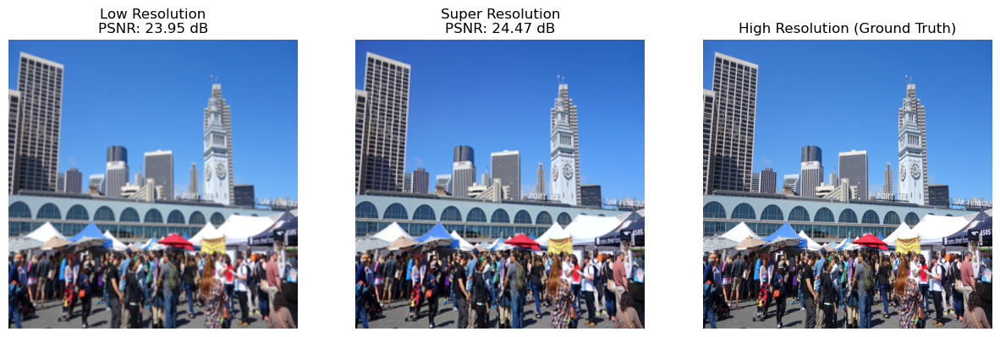

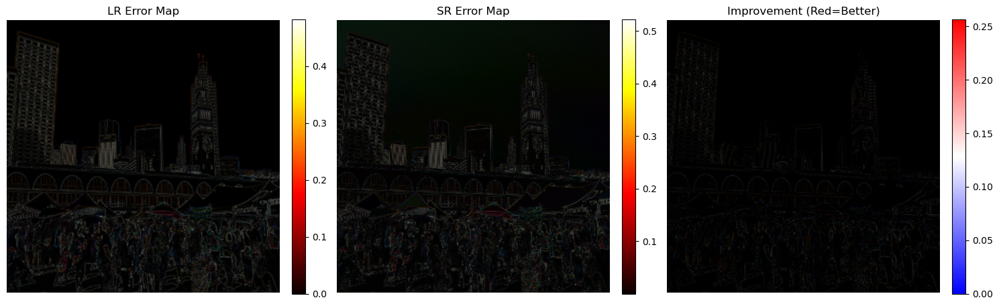

 15%|█▌        | 3/20 [00:59<05:41, 20.12s/it]

Epoch 3/20
Train Loss: 0.005501, Val Loss: 0.008975
LR: 1.00e-04
Epoch 4/20
Train Loss: 0.005483, Val Loss: 0.008444
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2781747281551361..0.22971105575561523].


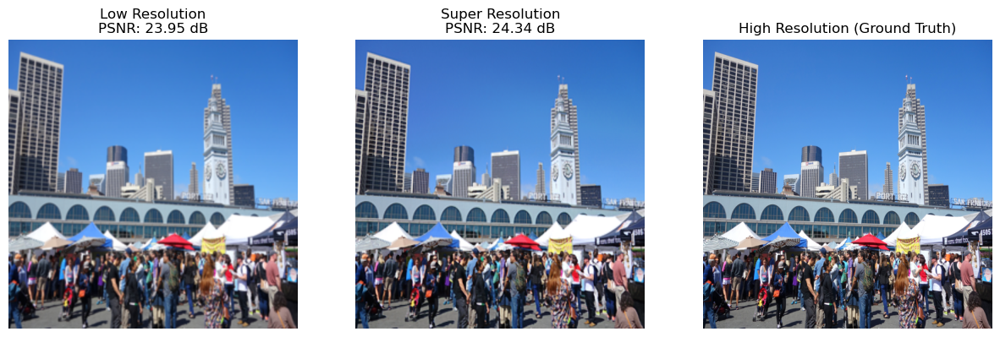

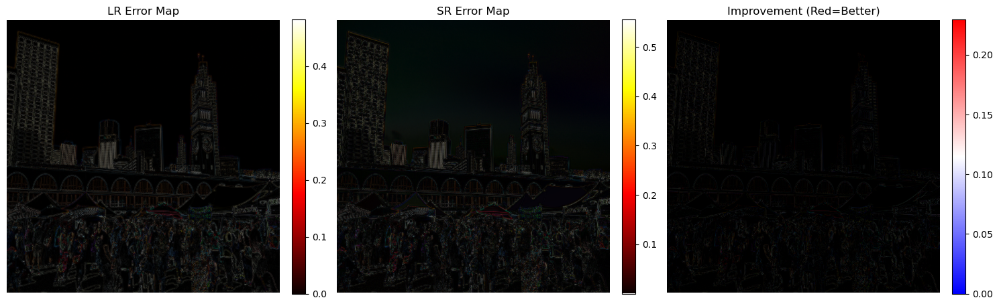

 25%|██▌       | 5/20 [01:39<04:57, 19.86s/it]

Epoch 5/20
Train Loss: 0.005496, Val Loss: 0.007783
LR: 1.00e-04
Epoch 6/20
Train Loss: 0.005514, Val Loss: 0.007744
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.29363033175468445..0.2292446792125702].


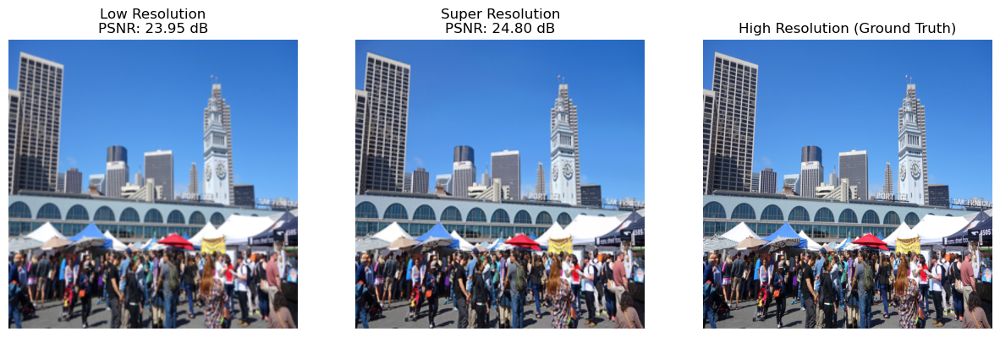

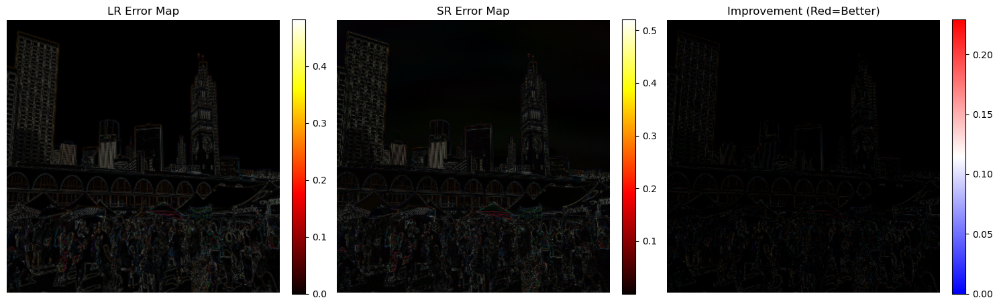

 35%|███▌      | 7/20 [02:18<04:14, 19.58s/it]

Epoch 7/20
Train Loss: 0.005486, Val Loss: 0.007945
LR: 1.00e-04
Epoch 8/20
Train Loss: 0.005470, Val Loss: 0.007685
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2823200523853302..0.22770148515701294].


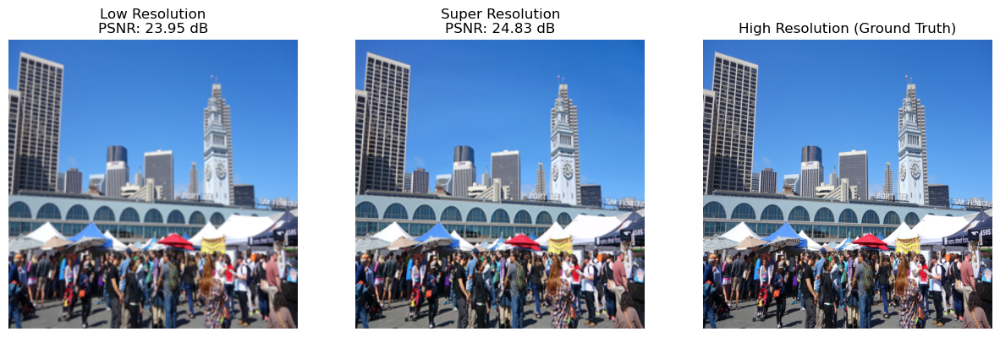

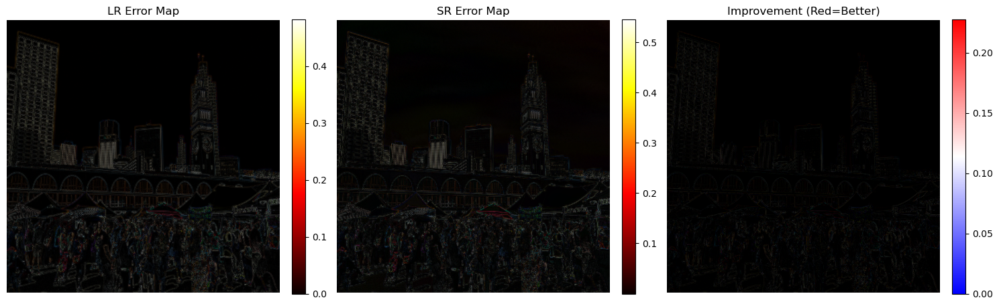

 45%|████▌     | 9/20 [02:55<03:28, 18.93s/it]

Epoch 9/20
Train Loss: 0.005473, Val Loss: 0.007756
LR: 1.00e-04
Epoch 10/20
Train Loss: 0.005478, Val Loss: 0.007740
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32887402176856995..0.2271682322025299].


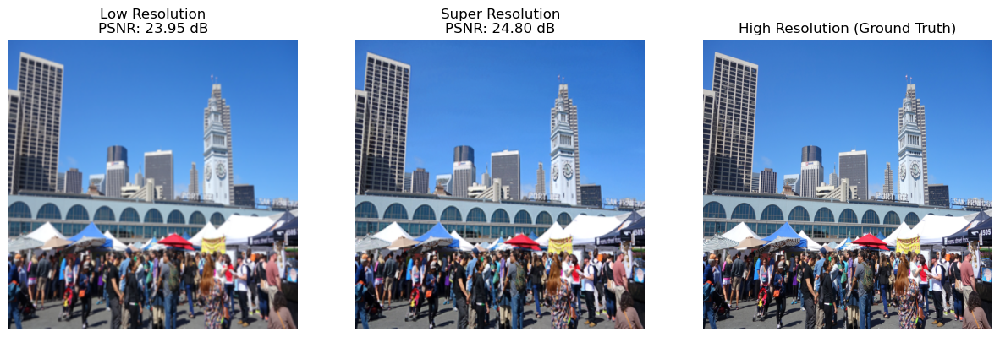

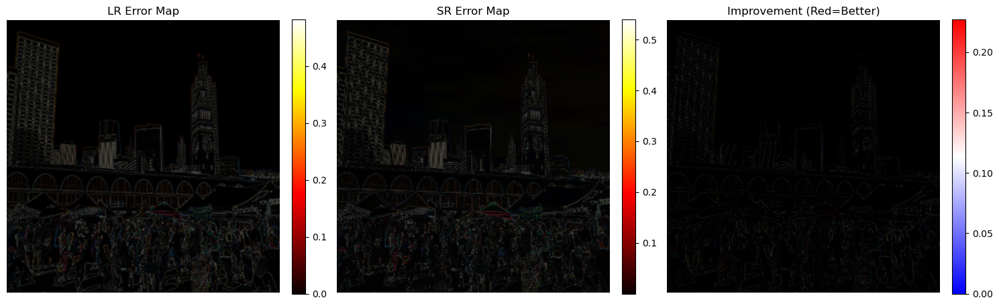

 55%|█████▌    | 11/20 [03:33<02:49, 18.85s/it]

Epoch 11/20
Train Loss: 0.005499, Val Loss: 0.007791
LR: 1.00e-04
Epoch 12/20
Train Loss: 0.005512, Val Loss: 0.007608
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.31461556255817413..0.2430528700351715].


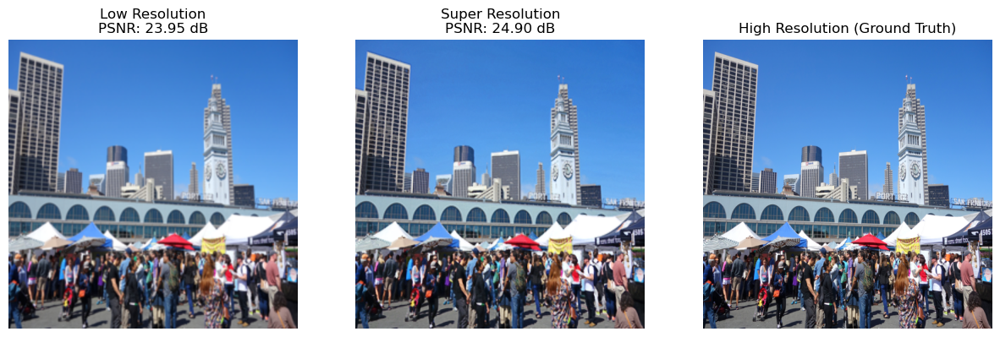

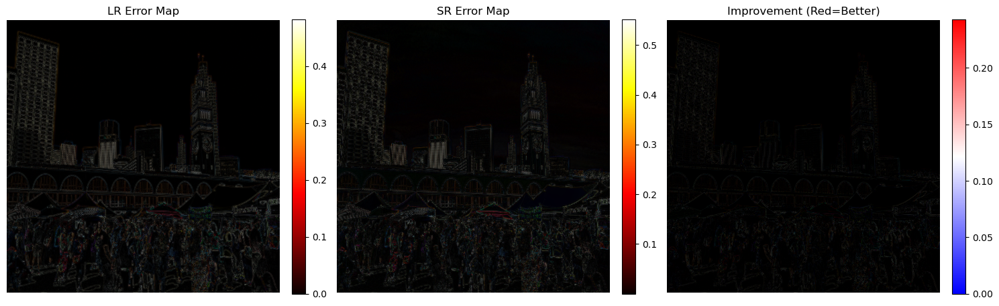

 65%|██████▌   | 13/20 [04:11<02:12, 18.94s/it]

Epoch 13/20
Train Loss: 0.005549, Val Loss: 0.007493
LR: 1.00e-04
Epoch 14/20
Train Loss: 0.005578, Val Loss: 0.007757
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34470924735069275..0.2424876093864441].


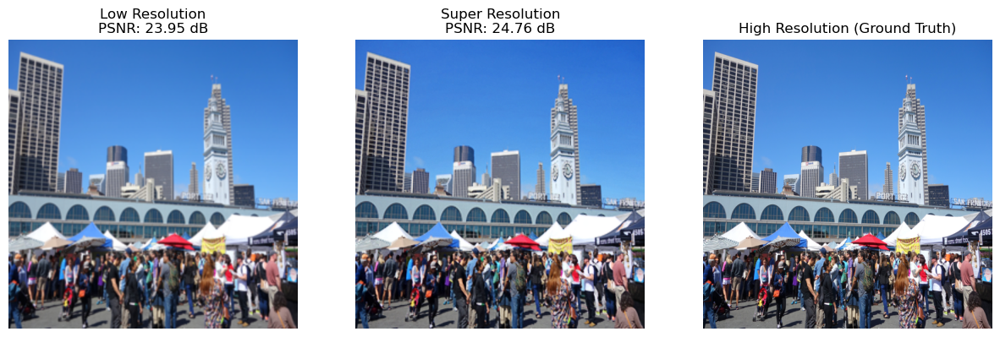

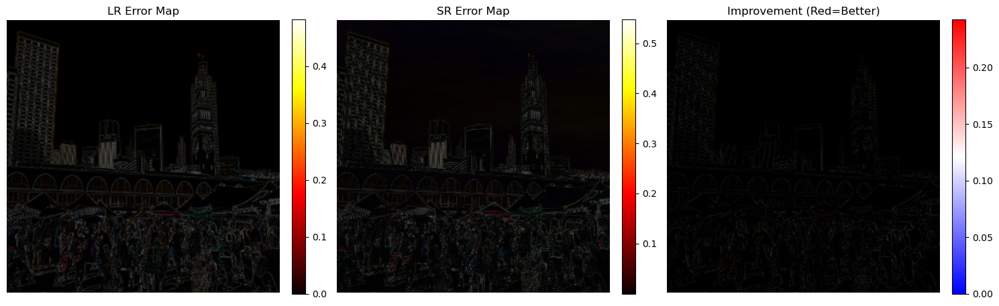

 75%|███████▌  | 15/20 [04:51<01:37, 19.53s/it]

Epoch 15/20
Train Loss: 0.005610, Val Loss: 0.007810
LR: 1.00e-04
Epoch 16/20
Train Loss: 0.005646, Val Loss: 0.007597
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34920555353164673..0.2323419451713562].


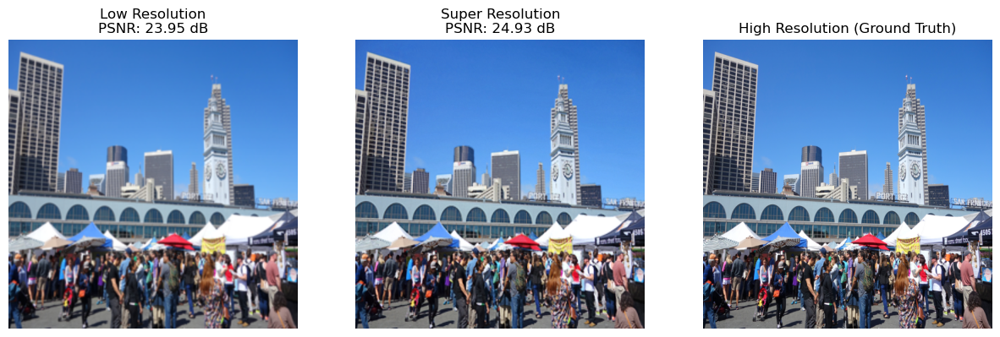

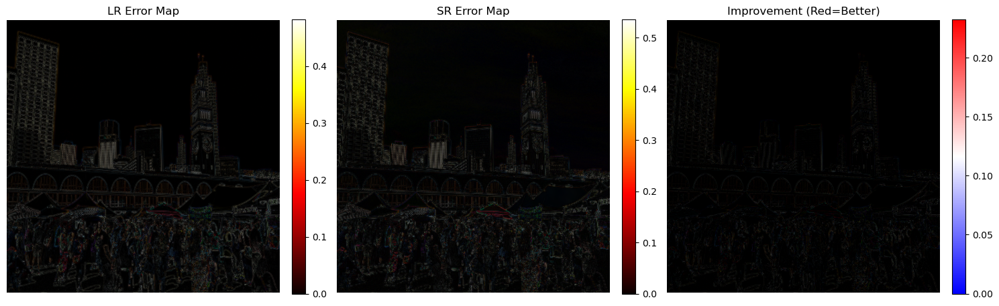

 85%|████████▌ | 17/20 [05:30<00:58, 19.59s/it]

Epoch 17/20
Train Loss: 0.005641, Val Loss: 0.007660
LR: 1.00e-04
Epoch 18/20
Train Loss: 0.005660, Val Loss: 0.007538
LR: 1.00e-04


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32814353704452515..0.2686622440814972].


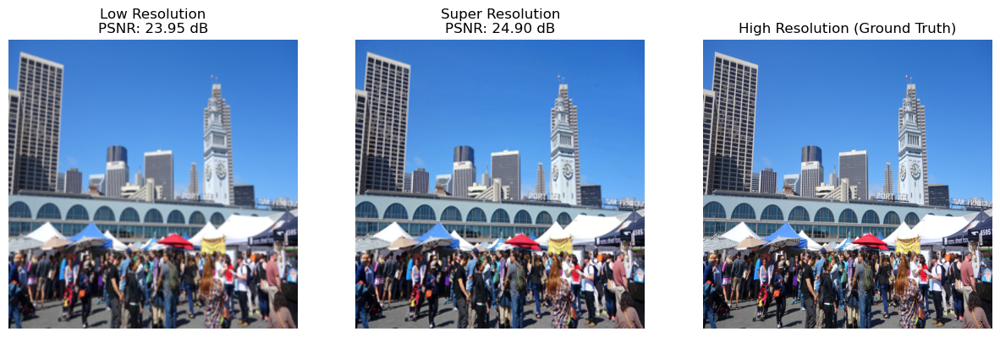

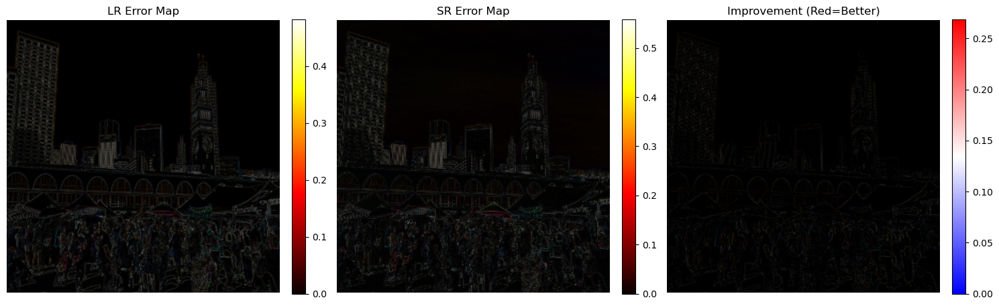

 95%|█████████▌| 19/20 [06:15<00:21, 21.08s/it]

Epoch 19/20
Train Loss: 0.005655, Val Loss: 0.007871
LR: 5.00e-05
Epoch 20/20
Train Loss: 0.005449, Val Loss: 0.007479
LR: 5.00e-05


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3495154082775116..0.24817079305648804].


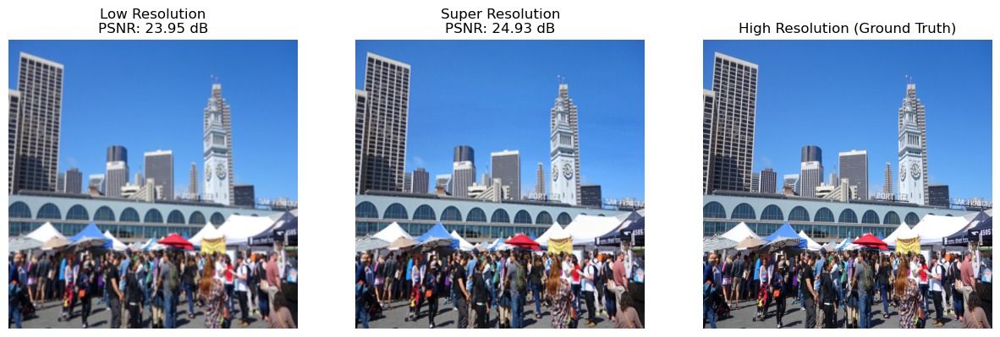

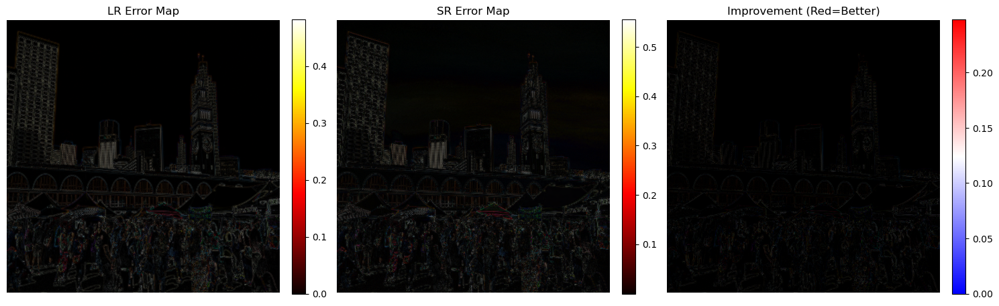

100%|██████████| 20/20 [06:36<00:00, 19.81s/it]


In [16]:
train_super_resolution(config, train_loader, val_loader, train_dataset, val_dataset)